In [1]:
import pandas as pd
import numpy as np

# Load and transform the data
df = pd.read_csv('../../data/vns_dataset_threshold_sim.csv')

# Transform the data
data_ab = df.copy()
data_ab = data_ab[data_ab['C_activation_level'] == 0.0]
data_ab = data_ab[['nerve_a', 'nerve_b', 'pulse_width', 'frequency', 'amplitude', 'AB_activation_level']]
data_ab.columns = ['nerve_a', 'nerve_b', 'pulse_width', 'frequency', 'amplitude', 'activation_level']
data_ab['fibre_type'] = 'AB'

# Transform the data for C fibers
data_c = df.copy()
data_c = data_c[data_c['AB_activation_level'] == 1.0]
data_c = data_c[['nerve_a', 'nerve_b', 'pulse_width', 'frequency', 'amplitude', 'C_activation_level']]
data_c.columns = ['nerve_a', 'nerve_b', 'pulse_width', 'frequency', 'amplitude', 'activation_level']
data_c['fibre_type'] = 'C'

data = pd.concat([data_ab, data_c], ignore_index=True)

# data = pd.get_dummies(data, columns=['fibre_type'])

data.loc[data['fibre_type'] == 'AB', 'fibre_type'] = 0.0
data.loc[data['fibre_type'] == 'C', 'fibre_type'] = 1.0

data = data.astype('float32')
data.head()

data_ab = data.loc[data['fibre_type'] == 0.0, :]
data_c = data.loc[data['fibre_type'] == 1.0, :]

In [2]:
# 3D scatter plot of pulse width, amplitude and activation level
import plotly.graph_objs as go
import plotly.express as px

# data_c = data.loc[data['fibre_type'] == 1.0, :]
# data_ = data_c.loc[data_c['nerve_a'] == 194.339, :]

# Create the 3D scatter plot
# data_c["frequency"] = data_c["frequency"].astype(str)
fig = px.scatter_3d(
    data_frame=data_c,
    x='amplitude',
    y='pulse_width',
    z='activation_level',
    color='frequency',
    opacity=0.6,
    color_continuous_scale='viridis',
)

# alternative to viridis

# dict where fibre_type is 0.0, it should be 5 and where it is 1.0, it should be 10
fibre_type = data_c['fibre_type'].values
fibre_type_size = np.where(fibre_type == 0.0, 15, 10)

# Update the marker size
fig.update_traces(marker=dict(size=fibre_type_size))

# remove white outline
fig.update_traces(marker=dict(line=dict(width=0)))

# Update the layout
fig.update_layout(
    scene=dict(
        xaxis_title='Amplitude (mA)',
        yaxis_title='Pulse Width (ms)',
        zaxis_title='Activation Level',
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

# Update legend text
fig.update_layout(
    coloraxis_colorbar=dict(title='Nerve Major\nDiameter (μm)'),
)
# add a title
# fig.update_layout(title_text='Unmyelinated fibre activation level')

# Show the plot
fig.show()

In [4]:
%pip install -U kaleido

  Using cached kaleido-1.0.0-py3-none-any.whl (51 kB)
  Using cached choreographer-1.0.9-py3-none-any.whl (51 kB)
  Using cached logistro-1.1.0-py3-none-any.whl (7.9 kB)
  Using cached orjson-3.11.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (131 kB)
  Using cached simplejson-3.20.1-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (138 kB)

[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved myelinated_frequency


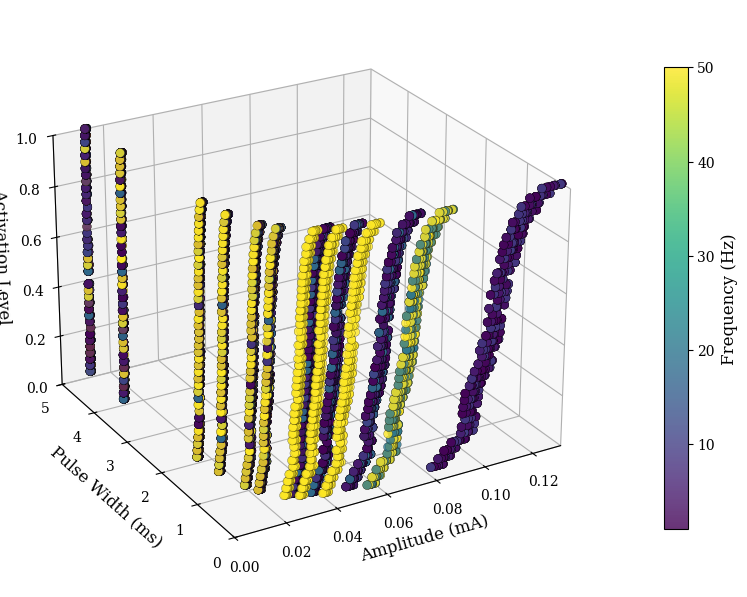

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved unmyelinated_frequency


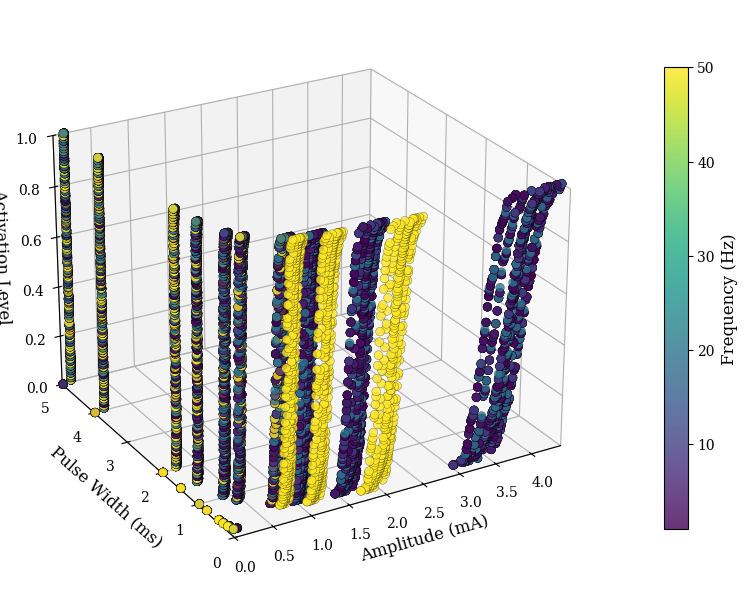

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved myelinated_nerve_diameter


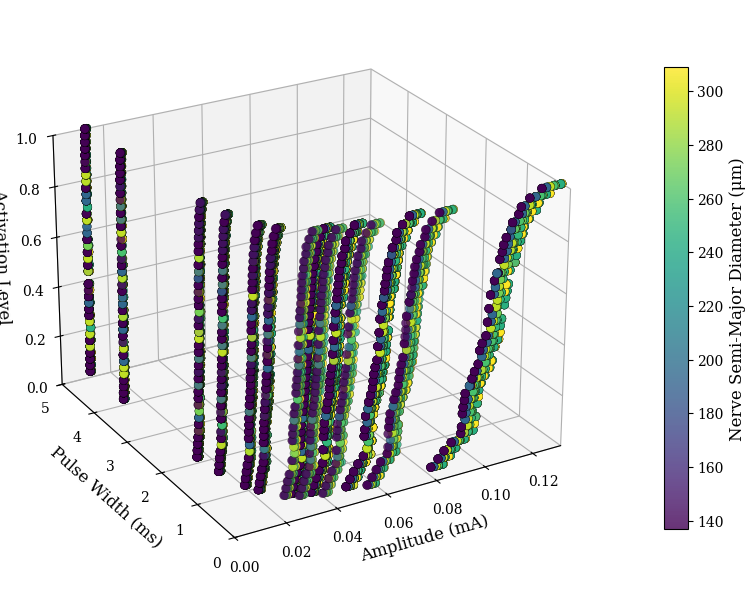

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


Saved unmyelinated_nerve_diameter


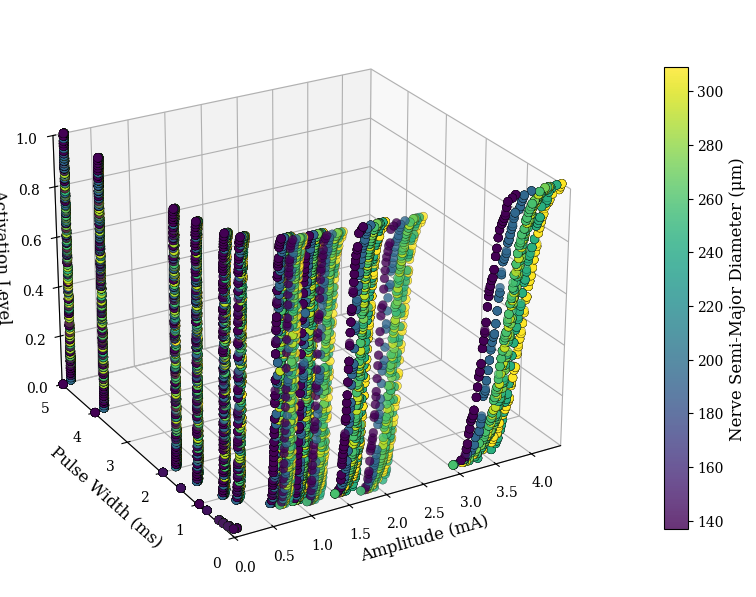

In [23]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np


plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']


def plot_3d_matplotlib(data_subset, color_col, fibre_label, color_label, filename):
    fig = plt.figure(figsize=(8,8))
    ax = fig.add_subplot(111, projection='3d')
    
    sc = ax.scatter(
        data_subset['amplitude'], 
        data_subset['pulse_width'], 
        data_subset['activation_level'],
        c=data_subset[color_col],
        cmap='viridis',
        alpha=0.8,
        s=40,
        edgecolor='k',
        linewidth=0.2
    )
    
    ax.set_xlabel('Amplitude (mA)', fontsize=12)
    ax.set_ylabel('Pulse Width (ms)', fontsize=12)
    ax.set_zlabel('Activation Level', fontsize=12)
    # ax.set_title(f'{fibre_label} Fibres — Colored by {color_label}', fontsize=14)
    
    ax.set_facecolor('white')
    fig.patch.set_facecolor('white')
    
    cbar = fig.colorbar(sc, ax=ax, shrink=0.6, pad=0.1)
    cbar.set_label(color_label, fontsize=12)
    
    # Get data bounds
    x_min, x_max = data_subset['amplitude'].min(), data_subset['amplitude'].max()
    y_min, y_max = data_subset['pulse_width'].min(), data_subset['pulse_width'].max()
    z_min, z_max = data_subset['activation_level'].min(), data_subset['activation_level'].max()
    
    # To make origin (or near origin) the closest, set axis limits starting near zero
    # (Assuming all data positive; if not, can adjust logic)
    ax.set_xlim(left=0, right=x_max)
    ax.set_ylim(bottom=0, top=y_max)
    ax.set_zlim(bottom=0, top=z_max)
    
    # Set view angle: 
    # elev controls vertical tilt, azim controls horizontal rotation
    # This places the camera roughly above and in front of origin, looking towards positive axes
    ax.view_init(elev=25, azim=240)
    
    plt.tight_layout()
    plt.savefig(f'{filename}.eps', dpi=300)
    print(f"Saved {filename}")
    plt.savefig(f'{filename}.png', dpi=300)
    plt.show()


# Usage
data_myel = data[data['fibre_type'] == 0]
data_unmyel = data[data['fibre_type'] == 1]

plot_3d_matplotlib(data_myel, 'frequency', 'Myelinated', 'Frequency (Hz)', 'myelinated_frequency')
plot_3d_matplotlib(data_unmyel, 'frequency', 'Unmyelinated', 'Frequency (Hz)', 'unmyelinated_frequency')
plot_3d_matplotlib(data_myel, 'nerve_a', 'Myelinated', 'Nerve Semi-Major Diameter (μm)', 'myelinated_nerve_diameter')
plot_3d_matplotlib(data_unmyel, 'nerve_a', 'Unmyelinated', 'Nerve Semi-Major Diameter (μm)', 'unmyelinated_nerve_diameter')


Correlation with the activation level:
activation_level    1.000000
amplitude           0.026441
pulse_width         0.020380
frequency           0.000724
nerve_b            -0.005957
nerve_a            -0.019354
fibre_type         -0.047532
Name: activation_level, dtype: float64


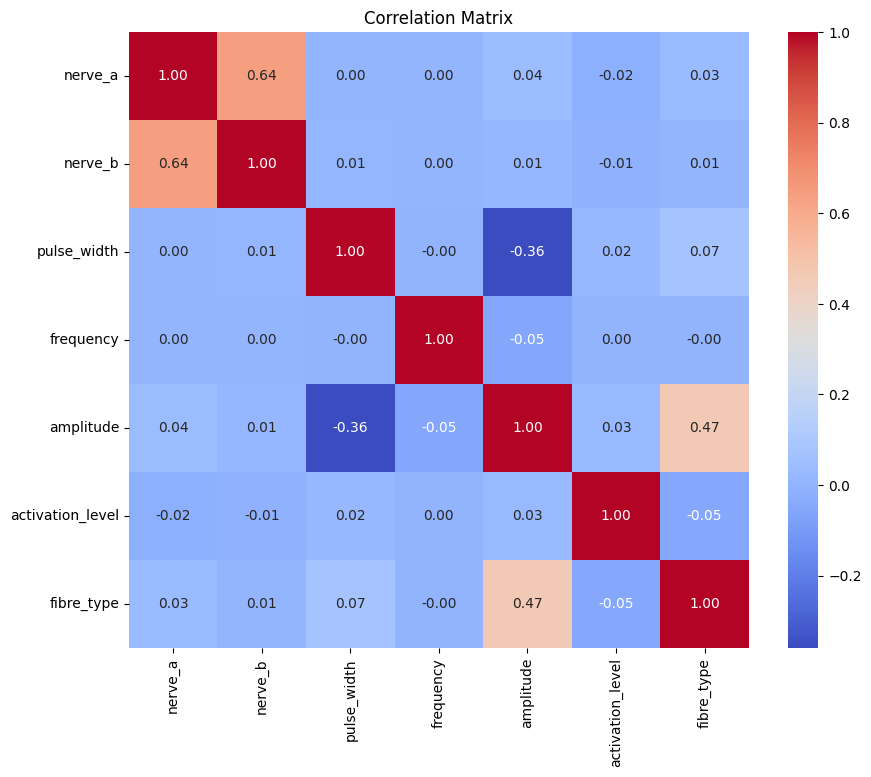

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Calculate the correlation matrix
correlation_matrix = data.corr()

# Extract correlations with the final column
final_column_correlation = correlation_matrix['activation_level'].sort_values(ascending=False)

# Print the correlations
print("Correlation with the activation level:")
print(final_column_correlation)

# Plot the correlations with a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title('Correlation Matrix')
plt.show()


In [13]:
data.head()

,nerve_a,nerve_b,pulse_width,frequency,amplitude,activation_level,fibre_type,charge
0,136.812897,119.578697,0.2,1.0,0.080818,0.0256,0.0,0.016164
1,136.812897,119.578697,0.2,1.0,0.083718,0.0513,0.0,0.016744
2,136.812897,119.578697,0.2,1.0,0.086135,0.0769,0.0,0.017227
3,136.812897,119.578697,0.2,1.0,0.089036,0.1026,0.0,0.017807
4,136.812897,119.578697,0.2,1.0,0.092903,0.1282,0.0,0.018581


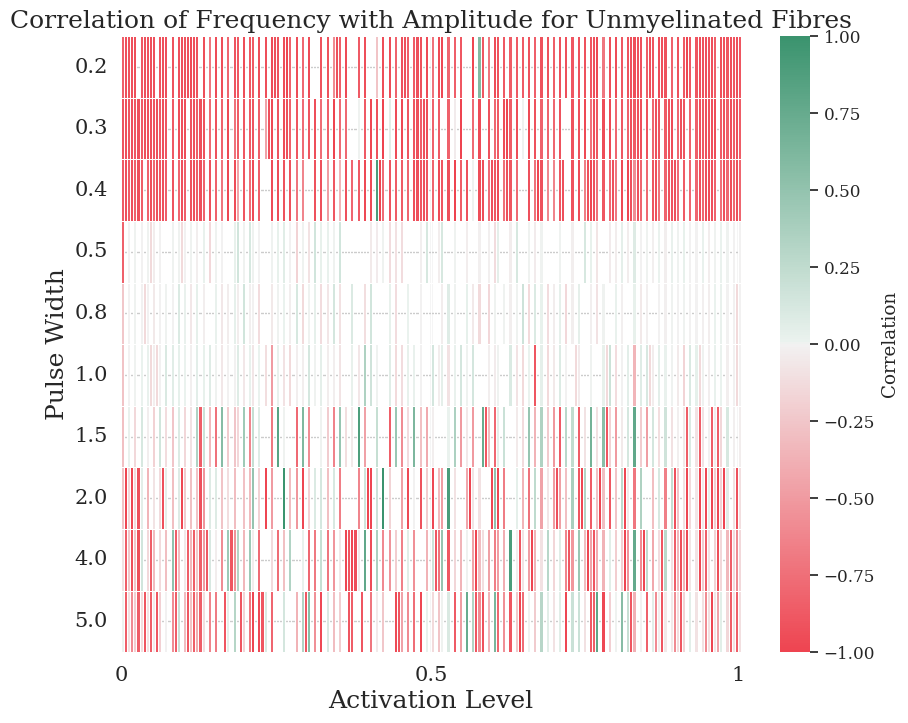

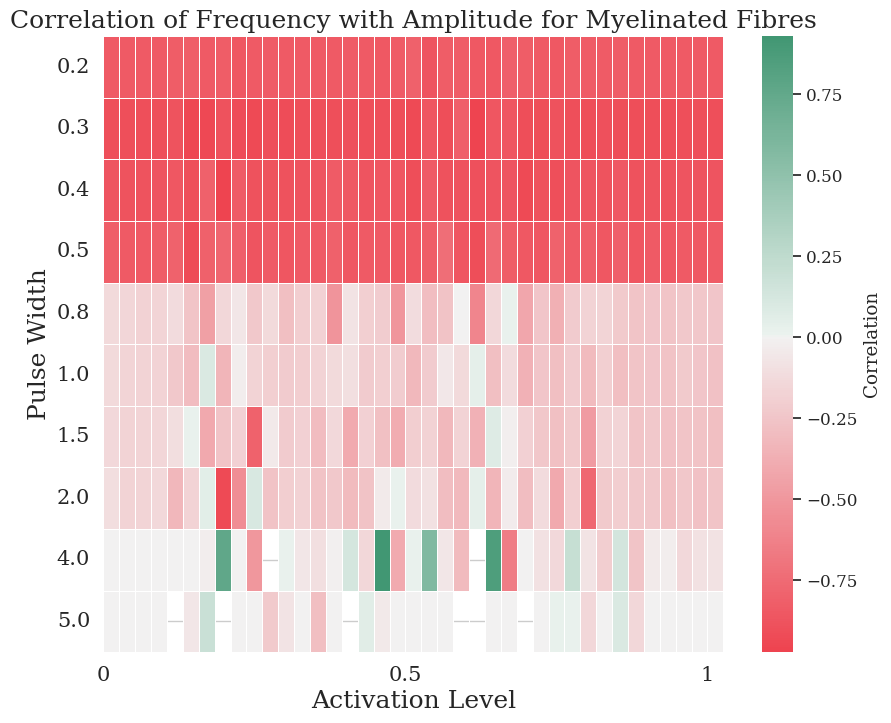

In [31]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

# Step 1: Separate the dataset into two subsets based on fibre_type
data_fibre_1 = data[data['fibre_type'] == 1]
data_fibre_0 = data[data['fibre_type'] == 0]

# Function to analyze the effect of frequency on amplitude for given pulse_width and activation_level
def analyze_effect(data_subset, pulse_width_val, activation_level_val):
    # Filter data for the specific pulse_width and activation_level
    subset_data = data_subset[(data_subset['pulse_width'] == pulse_width_val) & (data_subset['activation_level'] == activation_level_val)]
    
    if len(subset_data) > 2:  # Ensure enough data points exist for correlation calculation
        # Calculate the correlation between frequency and amplitude
        correlation = subset_data[['frequency', 'amplitude']].corr().iloc[0, 1]
        return correlation
    else:
        return None

# Step 2: Get unique pulse_width and activation_level combinations from the dataset
pulse_width_values = data['pulse_width'].unique()
activation_level_values = data['activation_level'].unique()

# Initialize lists to store results
sweep_results_fibre_1 = []
sweep_results_fibre_0 = []

# Step 3: Sweep through all combinations of pulse_width and activation_level
for pulse_width_val in pulse_width_values:
    for activation_level_val in activation_level_values:
        # Analyze for fibre_type = 1
        correlation_fibre_1 = analyze_effect(data_fibre_1, pulse_width_val, activation_level_val)
        if correlation_fibre_1 is not None:
            sweep_results_fibre_1.append({
                'Pulse Width': pulse_width_val,
                'Activation Level': activation_level_val,
                'Correlation': correlation_fibre_1,
                'Fibre Type': 1
            })
        
        # Analyze for fibre_type = 0
        correlation_fibre_0 = analyze_effect(data_fibre_0, pulse_width_val, activation_level_val)
        if correlation_fibre_0 is not None:
            sweep_results_fibre_0.append({
                'Pulse Width': pulse_width_val,
                'Activation Level': activation_level_val,
                'Correlation': correlation_fibre_0,
                'Fibre Type': 0
            })

# Step 4: Convert results to DataFrames
results_fibre_1_df = pd.DataFrame(sweep_results_fibre_1)
results_fibre_0_df = pd.DataFrame(sweep_results_fibre_0)

# Combine both results into a single DataFrame
sweep_results_df = pd.concat([results_fibre_1_df, results_fibre_0_df], ignore_index=True)



# Step 5: Visualize the results with a heatmap (no annotations, with colorbar for red-negative and green-positive)
def visualize_sweep_results(results_df, fibre_type):
    pivot_table = results_df.pivot(index='Pulse Width', columns='Activation Level', values='Correlation')
    plt.figure(figsize=(10, 8))
    
    # Define a custom colormap (red for negative, green for positive correlations)
    cmap = sns.diverging_palette(150, 10, s=80, l=55, as_cmap=True).reversed()  # Explicitly red-to-green palette

    # Generate heatmap without text annotations, with font set to Times and size 14
    sns.heatmap(pivot_table, cmap=cmap, center=0, linewidths=0.5, cbar_kws={'label': 'Correlation'})
    
    # Set font properties
    plt.title(f"Correlation of Frequency with Amplitude for {'Myelinated' if fibre_type == 0 else 'Unmyelinated'} Fibres", fontsize=18)
    plt.xlabel('Activation Level', fontsize=18)
    plt.ylabel('Pulse Width', fontsize=18)
    
    # Set tick labels with Times New Roman font and size 14, only for 0, 0.5, and 1
    plt.xticks(ticks=[0, pivot_table.shape[1] // 2, pivot_table.shape[1] - 1], 
               labels=[0, 0.5, 1], fontsize=15, rotation=0)
    plt.yticks(fontsize=15, rotation=0)
    plt.savefig(f'heatmap-corr-{fibre_type}.png', dpi=300, bbox_inches='tight')
    plt.savefig(f'heatmap-corr-{fibre_type}.eps', dpi=300, format='eps', bbox_inches='tight')
    plt.show()

# Visualize for fibre_type = 1
visualize_sweep_results(results_fibre_1_df, 1)

# Visualize for fibre_type = 0
visualize_sweep_results(results_fibre_0_df, 0)


# Optionally save the results to a CSV file
# sweep_results_df.to_csv('sweep_results_frequency_amplitude.csv', index=False)


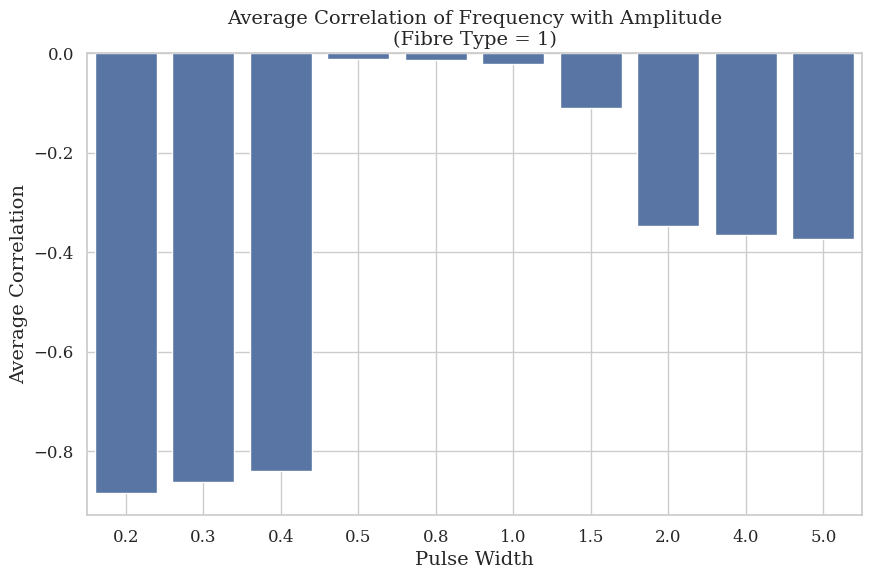

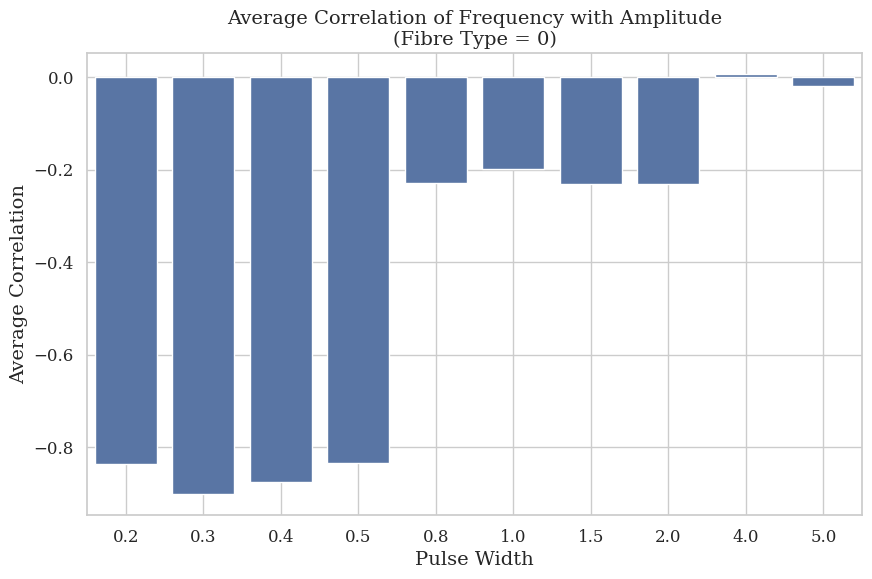

In [32]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

# Step 1: Separate the dataset into two subsets based on fibre_type
data_fibre_1 = data[data['fibre_type'] == 1]
data_fibre_0 = data[data['fibre_type'] == 0]

# Function to analyze the effect of frequency on amplitude for given pulse_width and activation_level
def analyze_effect(data_subset, pulse_width_val, activation_level_val):
    # Filter data for the specific pulse_width and activation_level
    subset_data = data_subset[(data_subset['pulse_width'] == pulse_width_val) & (data_subset['activation_level'] == activation_level_val)]
    
    if len(subset_data) > 2:  # Ensure enough data points exist for correlation calculation
        # Calculate the correlation between frequency and amplitude
        correlation = subset_data[['frequency', 'amplitude']].corr().iloc[0, 1]
        return correlation
    else:
        return None

# Step 2: Get unique pulse_width and activation_level combinations from the dataset
pulse_width_values = data['pulse_width'].unique()
activation_level_values = data['activation_level'].unique()

# Initialize lists to store results
sweep_results_fibre_1 = []
sweep_results_fibre_0 = []

# Step 3: Sweep through all combinations of pulse_width and activation_level
for pulse_width_val in pulse_width_values:
    for activation_level_val in activation_level_values:
        # Analyze for fibre_type = 1
        correlation_fibre_1 = analyze_effect(data_fibre_1, pulse_width_val, activation_level_val)
        if correlation_fibre_1 is not None:
            sweep_results_fibre_1.append({
                'Pulse Width': pulse_width_val,
                'Activation Level': activation_level_val,
                'Correlation': correlation_fibre_1,
                'Fibre Type': 1
            })
        
        # Analyze for fibre_type = 0
        correlation_fibre_0 = analyze_effect(data_fibre_0, pulse_width_val, activation_level_val)
        if correlation_fibre_0 is not None:
            sweep_results_fibre_0.append({
                'Pulse Width': pulse_width_val,
                'Activation Level': activation_level_val,
                'Correlation': correlation_fibre_0,
                'Fibre Type': 0
            })

# Step 4: Convert results to DataFrames
results_fibre_1_df = pd.DataFrame(sweep_results_fibre_1)
results_fibre_0_df = pd.DataFrame(sweep_results_fibre_0)

# Step 5: Calculate average correlation for each pulse width
def calculate_average_correlation(results_df):
    # Group by Pulse Width and calculate the mean correlation
    avg_correlation = results_df.groupby('Pulse Width')['Correlation'].mean().reset_index()
    return avg_correlation

# Calculate average correlation for fibre_type = 1 and fibre_type = 0
avg_correlation_fibre_1 = calculate_average_correlation(results_fibre_1_df)
avg_correlation_fibre_0 = calculate_average_correlation(results_fibre_0_df)

# Step 6: Plot the average correlations in a bar chart
def plot_avg_correlation(avg_correlation_df, fibre_type):
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Pulse Width', y='Correlation', data=avg_correlation_df)#, palette="RdYlGn")
    
    # Set font properties and labels
    plt.title(f'Average Correlation of Frequency with Amplitude\n(Fibre Type = {fibre_type})', fontsize=14)
    plt.xlabel('Pulse Width', fontsize=14)
    plt.ylabel('Average Correlation', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True)
    plt.show()

# Plot for fibre_type = 1
plot_avg_correlation(avg_correlation_fibre_1, 1)

# Plot for fibre_type = 0
plot_avg_correlation(avg_correlation_fibre_0, 0)

# Optionally save the average correlations to CSV
# avg_correlation_fibre_1.to_csv('avg_correlation_fibre_1.csv', index=False)
# avg_correlation_fibre_0.to_csv('avg_correlation_fibre_0.csv', index=False)


In [8]:
avg_correlation_fibre_0.head()

,Pulse Width,Correlation
0,0.2,-0.836978
1,0.3,-0.902058
2,0.4,-0.875679
3,0.5,-0.834714
4,0.8,-0.227988


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


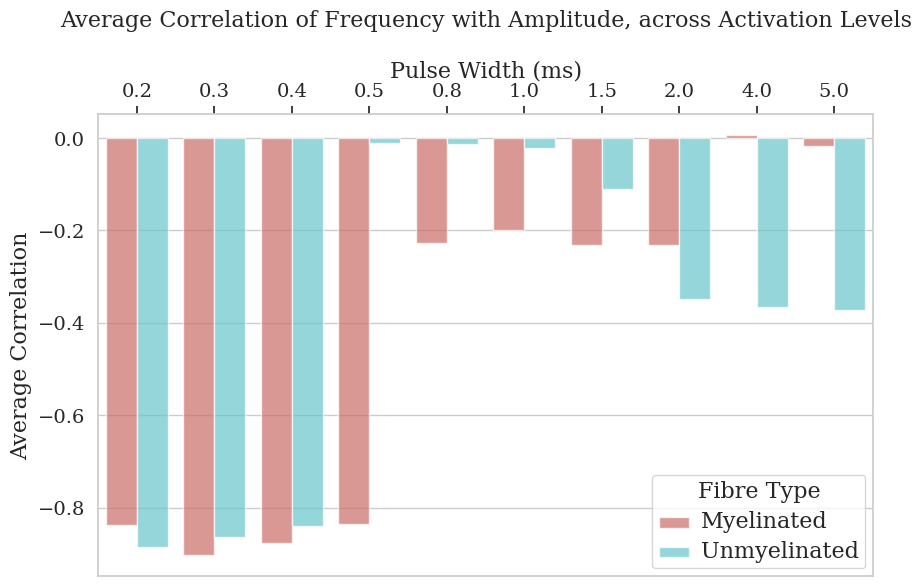

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


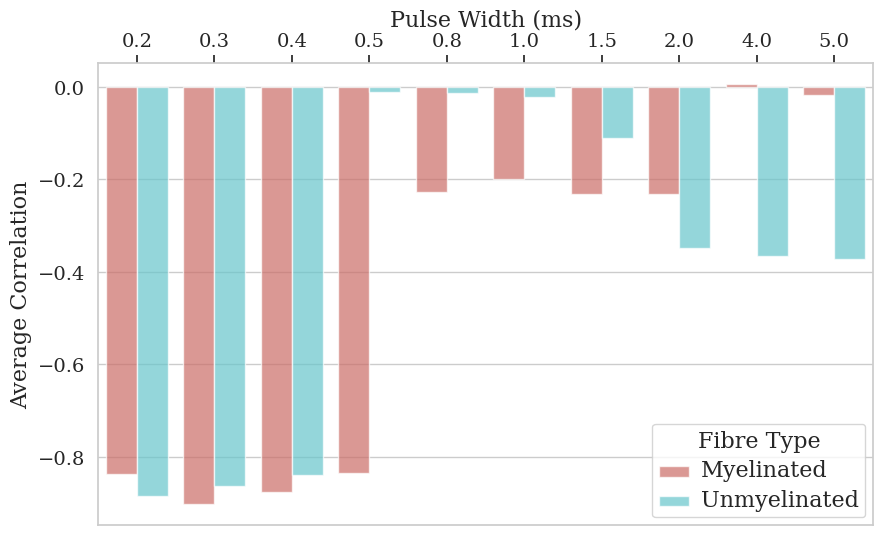

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl

plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

avg_correlation_fibre_0['Fibre Type'] = 'Myelinated'
avg_correlation_fibre_1['Fibre Type'] = 'Unmyelinated'

avg_correlations = pd.concat([avg_correlation_fibre_0, avg_correlation_fibre_1], ignore_index=True)

# Plot the average correlations in a bar chart
# sns.set_theme(style="whitegrid")
plt.figure(figsize=(10, 6))
# plt.title('Average Correlation of Frequency with Amplitude, across Activation Levels\n', fontsize=16)
plt.grid(True)
g = sns.barplot(x='Pulse Width', y='Correlation', data=avg_correlations, hue='Fibre Type', palette='hls', alpha=0.7)
# g.despine(left=True)
plt.ylabel('Average Correlation', fontsize=16)
# plt.legend(title='Fibre Type', fontsize='14', loc='lower right')
plt.setp(g.get_legend().get_texts(), fontsize=16) 
plt.setp(g.get_legend().get_title(), fontsize=16)  
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)
ax = plt.gca()
ax.xaxis.set_label_position('top')
plt.xlabel('Pulse Width (ms)', fontsize=16)
plt.setp(g.get_xticklabels(), fontsize=14)  
plt.setp(g.get_yticklabels(), fontsize=14)  
plt.savefig('avg_correlation_frequency.png', dpi=300, bbox_inches='tight')
plt.savefig('avg_correlation_frequency.eps', dpi=300, format='eps', bbox_inches='tight')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


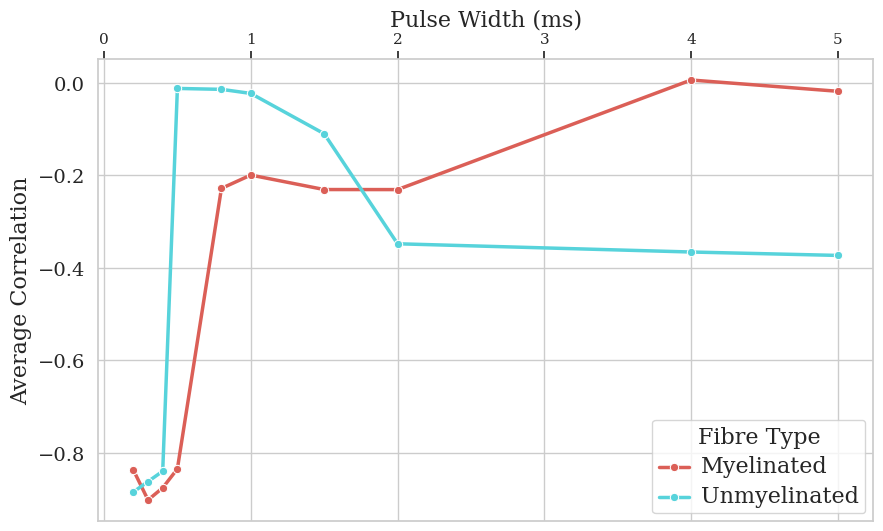

In [45]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

# Set font preferences (if Times New Roman is available)
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

# Combine correlation data
avg_correlation_fibre_0['Fibre Type'] = 'Myelinated'
avg_correlation_fibre_1['Fibre Type'] = 'Unmyelinated'
avg_correlations = pd.concat([avg_correlation_fibre_0, avg_correlation_fibre_1], ignore_index=True)

# Convert pulse width to numeric for proper ordering
avg_correlations['Pulse Width'] = avg_correlations['Pulse Width'].astype(float)

# Plot as a line graph
plt.figure(figsize=(10, 6))
plt.grid(True)

# Lineplot with markers
g = sns.lineplot(
    data=avg_correlations,
    x='Pulse Width',
    y='Correlation',
    hue='Fibre Type',
    palette='hls',
    marker='o',
    linewidth=2.5,
    alpha=1
)

# Labels and ticks
plt.ylabel('Average Correlation', fontsize=16)
plt.xlabel('Pulse Width (ms)', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)
ax = plt.gca()
ax.xaxis.set_label_position('top')

# Legend styling
plt.setp(g.get_legend().get_texts(), fontsize=16) 
plt.setp(g.get_legend().get_title(), fontsize=16)

# Save to file
plt.savefig('avg_correlation_frequency_line.png', dpi=300, bbox_inches='tight')
plt.savefig('avg_correlation_frequency_line.eps', dpi=300, format='eps', bbox_inches='tight')
plt.show()


findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times Ne

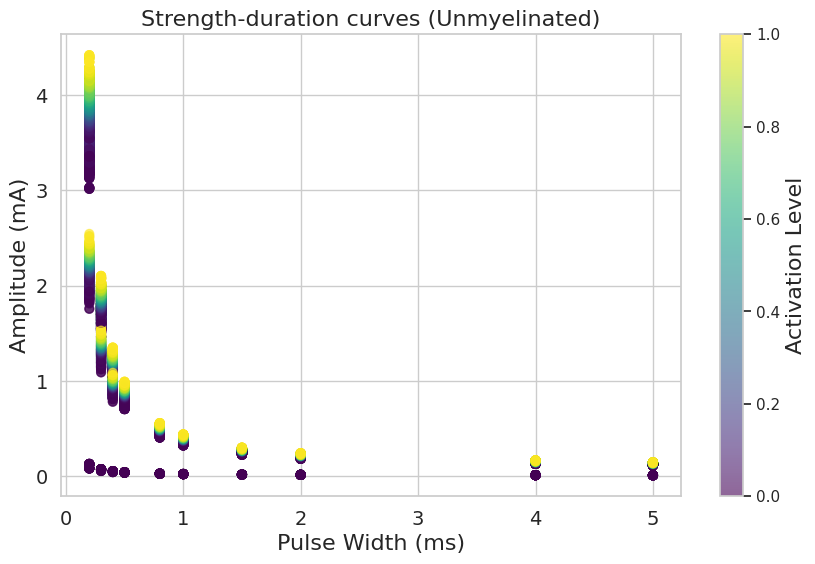

findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times Ne

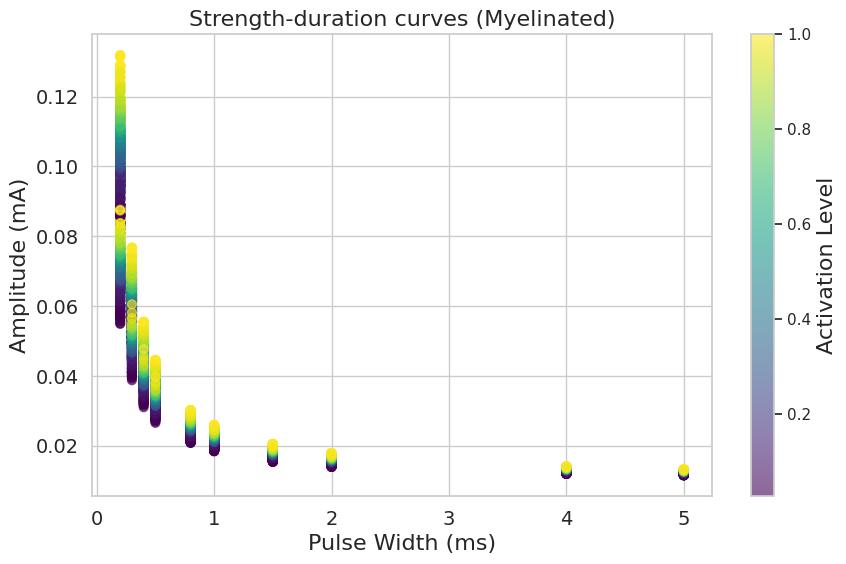

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Separate the dataset into two subsets based on fibre_type
data_fibre_1 = data[data['fibre_type'] == 1]
data_fibre_0 = data[data['fibre_type'] == 0]

# Step 2: Plot amplitude vs pulse width for all activation levels for fibre_type = 1
plt.figure(figsize=(10, 6))
scatter = plt.scatter(data_fibre_1['pulse_width'], data_fibre_1['amplitude'], 
                      c=data_fibre_1['activation_level'], cmap='viridis', s=40, alpha=0.6)
plt.colorbar(scatter).set_label(label='Activation Level', fontsize=16)
plt.title(f'Strength-duration curves (Unmyelinated)', fontsize=16)
plt.xlabel('Pulse Width (ms)', fontsize=16)
plt.ylabel('Amplitude (mA)', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(True)
plt.show()

# Step 3: Plot amplitude vs pulse width for all activation levels for fibre_type = 0
plt.figure(figsize=(10, 6))
scatter = plt.scatter(data_fibre_0['pulse_width'], data_fibre_0['amplitude'], 
                      c=data_fibre_0['activation_level'], cmap='viridis', s=40, alpha=0.6)
plt.colorbar(scatter).set_label(label='Activation Level', fontsize=16)
plt.title(f'Strength-duration curves (Myelinated)', fontsize=16)
plt.xlabel('Pulse Width (ms)', fontsize=16)
plt.ylabel('Amplitude (mA)', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(True)
plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


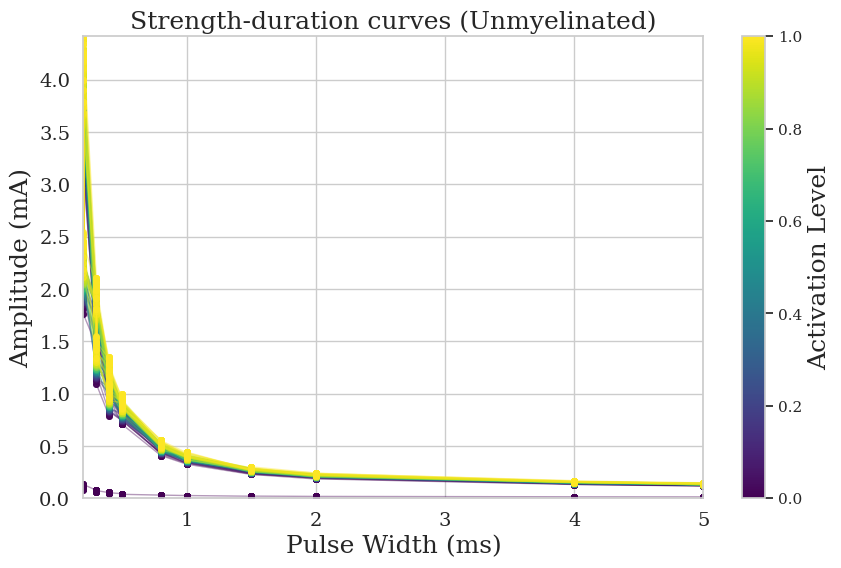

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


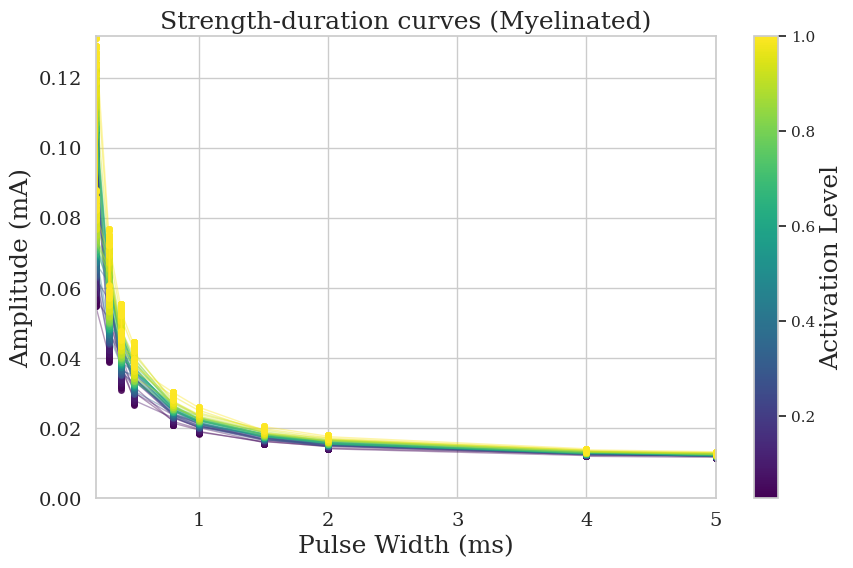

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.collections import LineCollection

plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

# Step 1: Separate the dataset into two subsets based on fibre_type
data_fibre_1 = data[data['fibre_type'] == 1]
data_fibre_0 = data[data['fibre_type'] == 0]

# Step 2: Function to filter out incomplete activation levels
def filter_incomplete_activation_levels(data_subset):
    # Find all pulse_width values
    all_pulse_widths = set(data_subset['pulse_width'].unique())
    
    # Find activation levels that have all pulse_width values
    valid_activation_levels = []
    for activation_level in data_subset['activation_level'].unique():
        pulse_widths_for_level = set(data_subset[data_subset['activation_level'] == activation_level]['pulse_width'])
        if pulse_widths_for_level == all_pulse_widths:  # Only keep activation levels with all pulse width values
            valid_activation_levels.append(activation_level)
    
    # Filter the dataset to only include valid activation levels
    filtered_data = data_subset[data_subset['activation_level'].isin(valid_activation_levels)]
    return filtered_data

# Step 3: Define a function to plot amplitude vs pulse width with a colorbar for activation levels
def plot_strength_duration(data_subset, fibre_type, title):
    # Filter data to remove incomplete activation levels
    data_subset_filtered = filter_incomplete_activation_levels(data_subset)

    plt.figure(figsize=(10, 6))

    # Get unique activation levels and normalize them for colormap
    activation_levels = data_subset_filtered['activation_level'].unique()
    norm = plt.Normalize(activation_levels.min(), activation_levels.max())
    cmap = plt.cm.viridis
    
    # Initialize a list to store line segments and their colors
    line_segments = []

    for activation_level in sorted(activation_levels):
        # Filter the data and sort by pulse_width to prevent "closing the shape"
        subset = data_subset_filtered[data_subset_filtered['activation_level'] == activation_level].sort_values(by='pulse_width')
        
        # Extract x and y values
        x = subset['pulse_width'].values
        y = subset['amplitude'].values
        
        # Create segments for LineCollection
        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segments = np.concatenate([points[:-1], points[1:]], axis=1)

        # Add interpolated line segments
        line_coll = LineCollection(segments, color=cmap(norm(activation_level)), alpha=0.4, linewidth=1)
        plt.gca().add_collection(line_coll)

        # Add markers to show actual data points
        plt.plot(x, y, 'o', color=cmap(norm(activation_level)), alpha=0.8, markersize=4)
        # Set limits for the axes
        plt.xlim(data_subset_filtered['pulse_width'].min(), data_subset_filtered['pulse_width'].max())
        plt.ylim(data_subset_filtered['amplitude'].min(), data_subset_filtered['amplitude'].max())
    
    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # Required to work with colorbar
    ax = plt.gca()
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label('Activation Level', fontsize=18)
    
    # Set labels and title
    plt.title(title, fontsize=18)
    plt.xlabel('Pulse Width (ms)', fontsize=18)
    plt.ylabel('Amplitude (mA)', fontsize=18)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)
    # make plot y axis ticks start from 0
    plt.gca().set_ylim(bottom=0)
    plt.savefig(f'strength-duration-{fibre_type}.png', dpi=300, bbox_inches='tight')
    plt.savefig(f'strength-duration-{fibre_type}.eps', dpi=300, format='eps', bbox_inches='tight')
    plt.show()

# Step 4: Plot amplitude vs pulse width for fibre_type = 1 (Unmyelinated)
plot_strength_duration(data_fibre_1, 1, 'Strength-duration curves (Unmyelinated)')

# Step 5: Plot amplitude vs pulse width for fibre_type = 0 (Myelinated)
plot_strength_duration(data_fibre_0, 0, 'Strength-duration curves (Myelinated)')


In [6]:
groups_ab = data_ab.groupby(['nerve_a', 'nerve_b'])

for group in groups_ab:
    print(group[0])
    print(group[1].head())

(136.8129, 119.5787)
      nerve_a     nerve_b  pulse_width  frequency  amplitude  \
0  136.812897  119.578697          0.2        1.0   0.080818   
1  136.812897  119.578697          0.2        1.0   0.083718   
2  136.812897  119.578697          0.2        1.0   0.086135   
3  136.812897  119.578697          0.2        1.0   0.089036   
4  136.812897  119.578697          0.2        1.0   0.092903   

   activation_level  fibre_type    charge  
0            0.0256         0.0  0.016164  
1            0.0513         0.0  0.016744  
2            0.0769         0.0  0.017227  
3            0.1026         0.0  0.017807  
4            0.1282         0.0  0.018581  
(194.339, 114.7554)
         nerve_a     nerve_b  pulse_width  frequency  amplitude  \
1693  194.339005  114.755402          0.2        1.0   0.082026   
1694  194.339005  114.755402          0.2        1.0   0.084927   
1695  194.339005  114.755402          0.2        1.0   0.087585   
1696  194.339005  114.755402          0.2 

findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times New Roman' not found.
findfont: Font family 'Times Ne

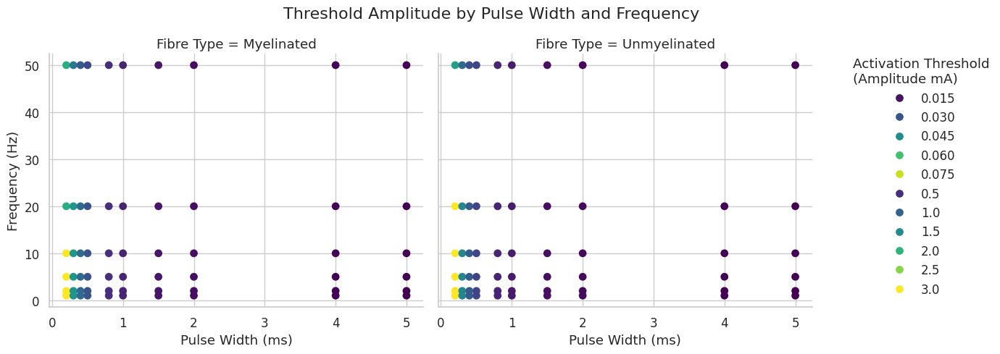

In [24]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Filter only rows where activation occurs
activated = data[data['activation_level'] > 0].copy()

# Step 2: Find threshold (min amplitude) for each fibre_type, pulse_width, frequency
thresholds = (
    activated
    .groupby(['fibre_type', 'pulse_width', 'frequency'], as_index=False)
    .agg({'amplitude': 'min'})
    .rename(columns={'amplitude': 'activation_threshold'})
)

# Step 3: Split into two DataFrames
thresholds['Fibre Type'] = thresholds['fibre_type'].map({0: 'Myelinated', 1: 'Unmyelinated'})

# Step 4: Plot with FacetGrid
sns.set(style="whitegrid", font='Times New Roman', font_scale=1.1)
g = sns.FacetGrid(
    thresholds, 
    col='Fibre Type', 
    height=5, aspect=1.2,
    margin_titles=True
)

g.map_dataframe(
    sns.scatterplot,
    x='pulse_width', y='frequency',
    hue='activation_threshold',
    palette='viridis',
    edgecolor='none',
    s=60
)

# Step 5: Final adjustments
g.add_legend(title='Activation Threshold\n(Amplitude mA)')
g.set_axis_labels("Pulse Width (ms)", "Frequency (Hz)")
g.set_titles("{col_name}")
plt.subplots_adjust(top=0.85)
g.fig.suptitle("Threshold Amplitude by Pulse Width and Frequency", fontsize=16)

# Save figure
plt.savefig("threshold_activation_vs_pw_freq.eps", format='eps', dpi=300, bbox_inches='tight')
plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


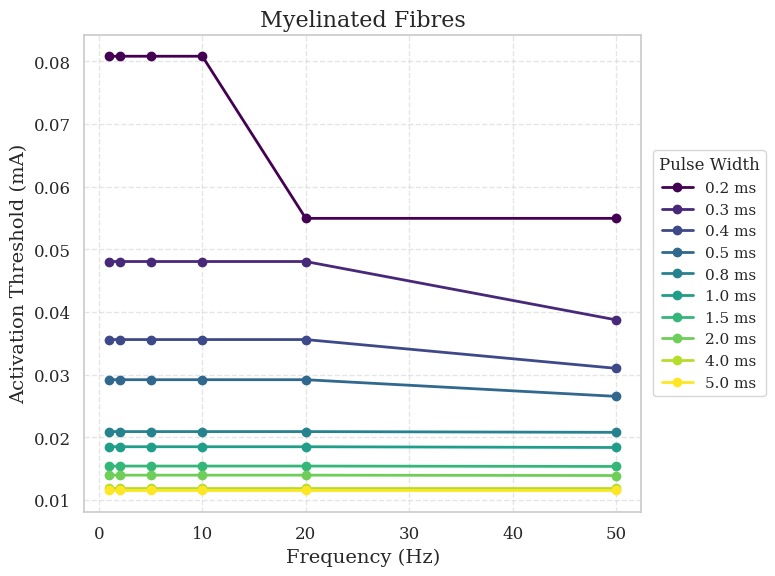

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


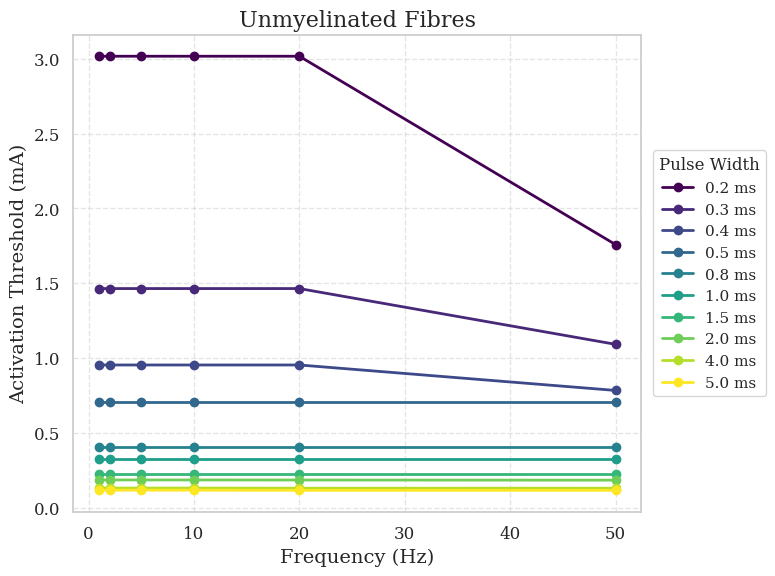

In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

# 1. Filter out only activated responses
activated = data[data['activation_level'] > 0].copy()

# 2. Compute threshold (min amplitude) for each condition
thresholds = (
    activated
    .groupby(['fibre_type', 'pulse_width', 'frequency'], as_index=False)
    .agg({'amplitude': 'min'})
    .rename(columns={'amplitude': 'activation_threshold'})
)

# 3. Map fibre_type for labeling
thresholds['Fibre Type'] = thresholds['fibre_type'].map({0: 'Myelinated', 1: 'Unmyelinated'})

# 4. Create color palette for pulse widths
pulse_widths = sorted(thresholds['pulse_width'].unique())
colors = cm.viridis(np.linspace(0, 1, len(pulse_widths)))
color_map = dict(zip(pulse_widths, colors))

# 5. Separate data
df_myel = thresholds[thresholds['Fibre Type'] == 'Myelinated']
df_unmyel = thresholds[thresholds['Fibre Type'] == 'Unmyelinated']

# 6. Plot function
def plot_threshold_vs_freq(data, fibre_label, filename):
    plt.figure(figsize=(8, 6))
    for pw in pulse_widths:
        subset = data[data['pulse_width'] == pw]
        plt.plot(subset['frequency'], subset['activation_threshold'],
                 label=f'{pw:.1f} ms', marker='o', color=color_map[pw], linewidth=2)

    plt.xlabel('Frequency (Hz)', fontsize=14)
    plt.ylabel('Activation Threshold (mA)', fontsize=14)
    plt.title(f'{fibre_label} Fibres', fontsize=16)
    plt.legend(
        title='Pulse Width',
        fontsize=11,
        title_fontsize=12,
        loc='center left',         # Position relative to anchor
        bbox_to_anchor=(1.02, 0.5),  # (x, y) offset from the axes (1.02 means just outside right)
        borderaxespad=0
    )
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.savefig(f'{filename}.eps', format='eps', dpi=300, bbox_inches='tight')
    plt.savefig(f'{filename}.png', format='png', dpi=300, bbox_inches='tight')

    plt.show()

# 7. Generate the two plots
plot_threshold_vs_freq(df_myel, 'Myelinated', 'threshold_vs_freq_myelinated')
plot_threshold_vs_freq(df_unmyel, 'Unmyelinated', 'threshold_vs_freq_unmyelinated')


In [18]:
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit

# Empirical model
def strength_duration_model(pw, I_rh, T_ch):
    return I_rh * (1 + (T_ch / pw))

# Assuming 'data' is the full dataset
data_fibre_1 = data[data['fibre_type'] == 1]
data_fibre_0 = data[data['fibre_type'] == 0]

data_fibre_1 = data_fibre_1[data_fibre_1['activation_level'] > 0]

def get_rheobase_chronaxies(data_subset, fibre_type):
    nerve_data_groups = data_subset.groupby(['nerve_a', 'nerve_b'])
    all_params = []
    
    for (nerve_a, nerve_b), nerve_data in nerve_data_groups:
        params_list = []
        frequencies = nerve_data['frequency'].unique()
        
        for frequency in sorted(frequencies):
            data_by_freq = nerve_data[nerve_data['frequency'] == frequency]
            
            activation_level_values = data_by_freq['activation_level'].unique()

            for activation_level in activation_level_values:
                data_by_act_freq = data_by_freq[data_by_freq['activation_level'] == activation_level]

                # print(data_by_act_freq.head(n=20))

                subset = data_by_act_freq.sort_values(by='pulse_width')
                pw = subset['pulse_width']  # Filter out very small pulse_width
                I_th = subset['amplitude']

                # Check if the subset is non-empty before fitting
                if len(pw) > 4 and len(I_th) > 4:
                    # print(len(pw), len(I_th))
                    try:
                        p0 = [np.mean(I_th), np.mean(pw)] # Initial guess for I_rh and T_ch
                        params, covariance = curve_fit(strength_duration_model, pw, I_th, p0=p0)
                        I_rh_fitted, T_ch_fitted = params
                        params_list.append([nerve_a, nerve_b, fibre_type, activation_level, frequency, I_rh_fitted, T_ch_fitted])
                    except RuntimeError:
                        print(f"Fit did not converge for nerve_a={nerve_a}, nerve_b={nerve_b}, activation_level={activation_level}, frequency={frequency}")
                    # print(f"Skipping nerve_a={nerve_a}, nerve_b={nerve_b}, activation_level={activation_level}, frequency={frequency} due to insufficient data.")
        
        all_params.extend(params_list)
    
    # Create DataFrame from all fitted parameters
    params_df = pd.DataFrame(all_params, columns=['nerve_a', 'nerve_b', 'fibre_type', 'Activation Level', 'Frequency', 'I_rh', 'T_ch'])
    
    return params_df

# Get rheobase and chronaxies for fibre types 1 and 0
params_fibre_1 = get_rheobase_chronaxies(data_fibre_1, 1)
params_fibre_0 = get_rheobase_chronaxies(data_fibre_0, 0)


/tmp/ipykernel_7454/386269516.py:42: OptimizeWarning:

Covariance of the parameters could not be estimated



In [7]:
params_fibre_1.describe()

,nerve_a,nerve_b,fibre_type,Activation Level,Frequency,I_rh,T_ch,I_rh0
count,1476.000000,1476.000000,1476.0,1476.000000,1476.000000,1476.000000,1476.000000,1476.000000
mean,248.364197,132.677704,1.0,0.507929,12.826558,0.928364,1.490753,0.956649
std,49.542007,13.348650,0.0,0.392202,15.903046,0.311536,0.483744,0.317068
min,136.812897,114.755402,1.0,0.009700,1.000000,0.222502,0.440000,0.222502
25%,245.418701,120.351700,1.0,0.098000,2.000000,0.719356,1.188889,0.759570
50%,258.748108,134.934799,1.0,0.558800,5.000000,0.948716,1.570000,0.985936
75%,292.657593,135.586807,1.0,0.911800,20.000000,1.122453,1.740000,1.161284
max,308.932190,159.531998,1.0,1.000000,50.000000,1.733411,2.700000,1.724503


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


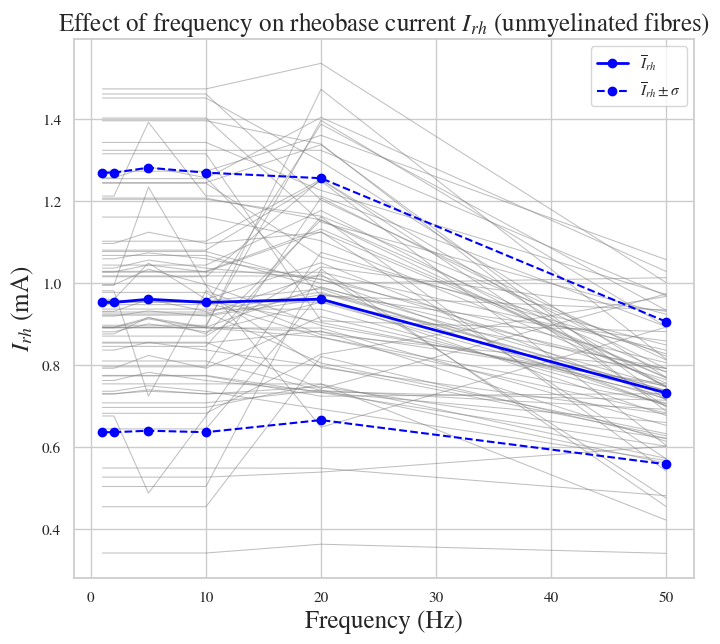

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


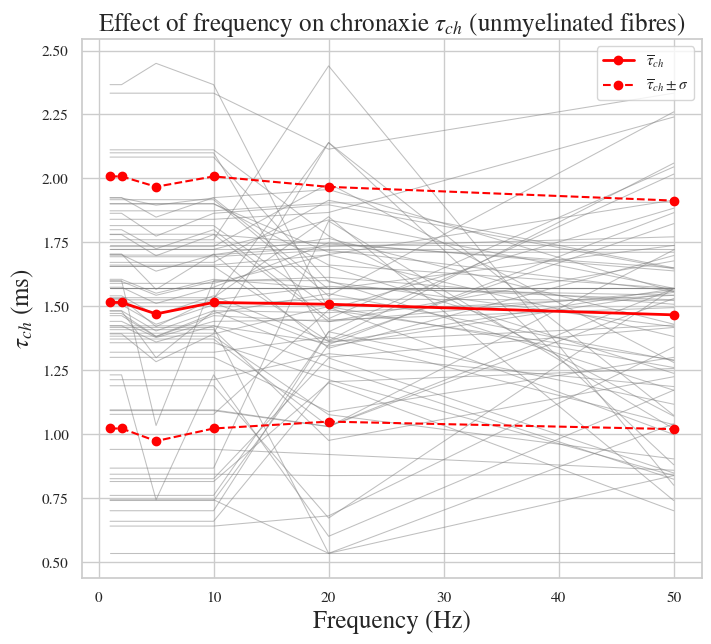

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


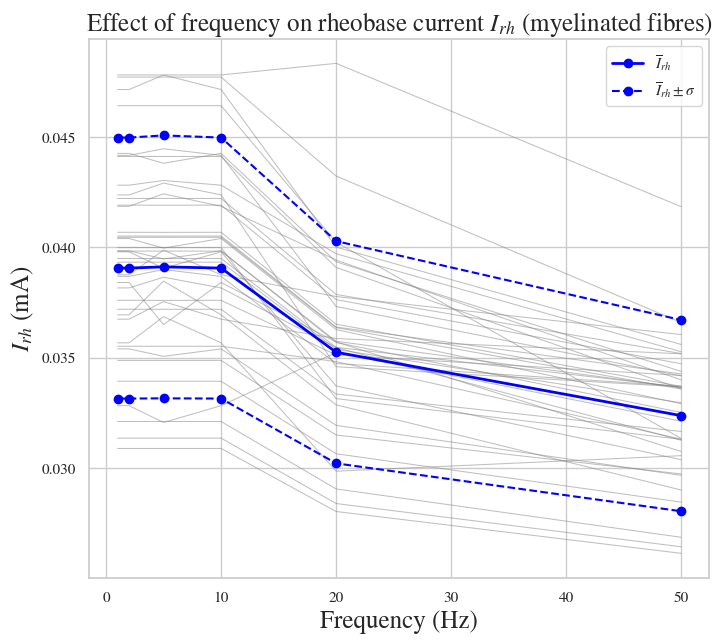

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


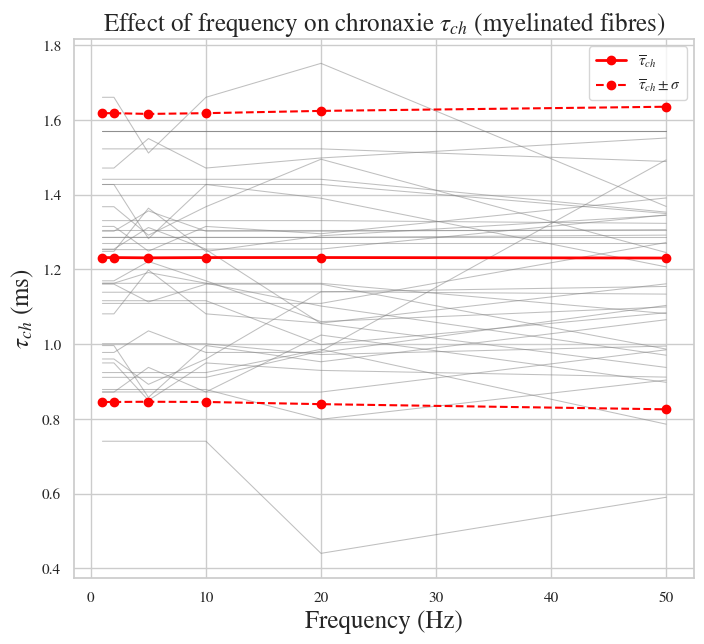

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['font.size'] = 22
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

plt.rcParams['mathtext.fontset'] = 'stix'  # Use STIX fonts, which are similar to LaTeX fonts
plt.rcParams['font.family'] = 'STIXGeneral'  # Set general font family to STIXGeneral
plt.rcParams['mathtext.it'] = 'serif:italic'  # Make math text italic

# Function to calculate and plot only activation levels with all frequency values
def plot_mean_and_std_with_filtered_activations(params_df, fibre_type):
    # Get the unique frequencies present in the dataset
    all_frequencies = params_df['Frequency'].unique()
    all_frequencies = np.sort(all_frequencies)

    valid_activation_levels = []

    # Identify activation levels that have data for all frequencies
    for activation_level in params_df['Activation Level'].unique():
        subset = params_df[params_df['Activation Level'] == activation_level]
        if set(subset['Frequency'].unique()) == set(all_frequencies):
            valid_activation_levels.append(activation_level)

    # Filter the dataset to include only the valid activation levels
    filtered_params = params_df[params_df['Activation Level'].isin(valid_activation_levels)]

    # Calculate and plot the mean and standard deviation across valid activation levels
    mean_std_df = filtered_params.groupby('Frequency').agg({
        'I_rh': ['mean', 'std'],
        'T_ch': ['mean', 'std']
    }).reset_index()

    # Prepare the plot
    plt.figure(figsize=(8, 7))

    # Plot individual lines for each activation level
    for activation_level in valid_activation_levels:
        subset = filtered_params[filtered_params['Activation Level'] == activation_level]
        mean_params = subset.groupby('Frequency').agg({'I_rh': 'mean', 'T_ch': 'mean'}).reset_index()

        # Plotting I_rh (light lines)
        plt.plot(mean_params['Frequency'], mean_params['I_rh'], color='gray', linestyle='-', alpha=0.5, linewidth=0.75)


    # Plotting mean and standard deviation for I_rh
    plt.plot(mean_std_df['Frequency'], mean_std_df['I_rh']['mean'], color='blue', linestyle='-',  marker='o', label='$\\overline{I}_{rh}$', linewidth=2)
    plt.plot(mean_std_df['Frequency'], mean_std_df['I_rh']['mean'] + mean_std_df['I_rh']['std'],  marker='o', color='blue', linestyle='--', label='$\\overline{I}_{rh} \pm \\sigma$', linewidth=1.5)
    plt.plot(mean_std_df['Frequency'], mean_std_df['I_rh']['mean'] - mean_std_df['I_rh']['std'],  marker='o', color='blue', linestyle='--', label='_nolegend_', linewidth=1.5)
    plt.xlabel('Frequency (Hz)', fontsize=18)
    plt.ylabel('$I_{rh}$ (mA)', fontsize=18)
    # plt.grid(True)
    plt.title(f'Effect of frequency on rheobase current $I_{{rh}}$ ({"unmyelinated fibres" if fibre_type == 1 else "myelinated fibres"})', fontsize=18)
    plt.legend(loc='upper right')
    plt.savefig(f'rheobase-frequency-{fibre_type}.eps', dpi=300, bbox_inches='tight', format='eps')
    plt.savefig(f'rheobase-frequency-{fibre_type}.png', dpi=300, bbox_inches='tight')
    plt.show()


    plt.figure(figsize=(8, 7))

    # Plot individual lines for each activation level
    for activation_level in valid_activation_levels:
        subset = filtered_params[filtered_params['Activation Level'] == activation_level]
        mean_params = subset.groupby('Frequency').agg({'I_rh': 'mean', 'T_ch': 'mean'}).reset_index()

        # Plotting T_ch (light lines)
        plt.plot(mean_params['Frequency'], mean_params['T_ch'], color='gray', linestyle='-', alpha=0.5, linewidth=0.75)


    # Plotting mean and standard deviation for T_ch
    plt.plot(mean_std_df['Frequency'], mean_std_df['T_ch']['mean'], color='red', linestyle='-', marker='o', label='$\\overline{\\tau}_{ch}$', linewidth=2)
    plt.plot(mean_std_df['Frequency'], mean_std_df['T_ch']['mean'] + mean_std_df['T_ch']['std'],  marker='o', color='red', linestyle='--', label='$\\overline{\\tau}_{ch} \pm \\sigma$', linewidth=1.5)
    plt.plot(mean_std_df['Frequency'], mean_std_df['T_ch']['mean'] - mean_std_df['T_ch']['std'],  marker='o', color='red', linestyle='--', label='_nolegend_', linewidth=1.5)
    plt.xlabel('Frequency (Hz)', fontsize=18)
    plt.ylabel('$\\tau_{ch}$ (ms)', fontsize=18)
    plt.title(f'Effect of frequency on chronaxie $\\tau_{{ch}}$ ({"unmyelinated fibres" if fibre_type == 1 else "myelinated fibres"})', fontsize=18)
    # plt.grid(True)
    plt.legend(loc='upper right')
    plt.savefig(f'chronaxie-frequency-{fibre_type}.png', dpi=300, bbox_inches='tight')
    plt.savefig(f'chronaxie-frequency-{fibre_type}.eps', dpi=300, bbox_inches='tight', format='eps')
    plt.show()

# Plot for fibre type 1
plot_mean_and_std_with_filtered_activations(params_fibre_1, fibre_type=1)

# Plot for fibre type 0
plot_mean_and_std_with_filtered_activations(params_fibre_0, fibre_type=0)


In [3]:
%pip install pysr

Note: you may need to restart the kernel to use updated packages.


In [4]:
params_fibre_1.head()

,nerve_a,nerve_b,fibre_type,Activation Level,Frequency,I_rh,T_ch
0,136.812897,119.578697,1,0.0196,1.0,1.041122,0.742857
1,136.812897,119.578697,1,0.0294,1.0,0.935096,1.500000
2,136.812897,119.578697,1,0.0588,1.0,0.769374,1.700000
3,136.812897,119.578697,1,0.0784,1.0,1.175271,1.300000
4,136.812897,119.578697,1,0.1863,1.0,1.186751,1.066667


In [5]:
import pandas as pd
import numpy as np
from pysr import PySRRegressor
import matplotlib.pyplot as plt

# Assuming `params_fibre_1` or `params_fibre_0` contains data for all fibers
# Example with params_fibre_1

# Step 1: Extract I_rh0 (when f = 1) for each nerve fiber
params_fibre_1['I_rh0'] = params_fibre_1.groupby(['nerve_a', 'nerve_b', 'Activation Level'])['I_rh'].transform(
    lambda x: x[params_fibre_1['Frequency'] == 1].mean() if sum(params_fibre_1['Frequency'] == 1) > 0 else np.nan)

# Drop rows where we don't have I_rh0 data
params_fibre_1.dropna(subset=['I_rh0'], inplace=True)

Detected IPython. Loading juliacall extension. See https://juliapy.github.io/PythonCall.jl/stable/compat/#IPython


c:\Users\btari\miniconda3\envs\ml\Lib\site-packages\pysr\sr.py:915: FutureWarning: `loss` has been renamed to `elementwise_loss` in PySRRegressor. Please use that instead.
  warnings.warn(
c:\Users\btari\miniconda3\envs\ml\Lib\site-packages\pysr\sr.py:2582: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
c:\Users\btari\miniconda3\envs\ml\Lib\site-packages\pysr\sr.py:73: UserWarning: You are using the `^` operator, but have not set up `constraints` for it. This may lead to overly complex expressions. One typical constraint is to use `constraints={..., '^': (-1, 1)}`, which will allow arbitrary-complexity base (-1) but only powers such as a constant or variable (1). For more tips, please see https://astroautomata.com/PySR/tuning/
  warnings.warn(


Compiling Julia backend...


[ Info: Started!



Expressions evaluated per second: 1.920e+04
Head worker occupation: 30.9%
Progress: 37 / 15000 total iterations (0.247%)
Hall of Fame:
---------------------------------------------------------------------------------------------------
Complexity  Loss       Score     Equation
2           2.834e-01  7.971e+00  y = exp(-0.69985)
3           1.864e-02  2.721e+00  y = x₁ * 0.96059
4           1.864e-02  1.318e-04  y = x₁ * exp(-0.038598)
5           1.541e-02  1.903e-01  y = x₁ ^ (0.98506 ^ x₀)
6           1.312e-02  1.608e-01  y = x₁ / exp(0.0068551 * x₀)
7           1.202e-02  8.774e-02  y = x₁ * ((0.95363 ^ x₀) ^ 0.10469)
8           1.201e-02  6.717e-04  y = exp((0.0068551 * x₀) * -0.70067) * x₁
9           9.804e-03  2.031e-01  y = x₁ - ((0.0086793 * (x₁ * x₀)) ^ 2.0585)
11          9.074e-03  3.866e-02  y = x₁ - (x₁ * ((0.0086793 * (x₁ * x₀)) ^ 2.0585))
14          8.878e-03  7.294e-03  y = x₁ - ((0.0086793 * ((x₀ * x₁) + -0.03312)) ^ (exp(0.53674)...
                               

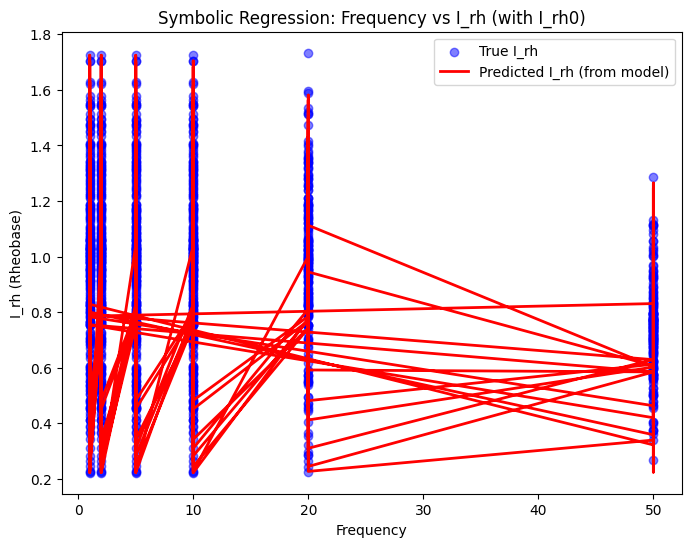

In [6]:
# Prepare the data for symbolic regression
# Inputs: Frequency and I_rh0
X = params_fibre_1[['Frequency', 'I_rh0']].values  # Frequency and I_rh0 as inputs
y = params_fibre_1['I_rh'].values                 # Rheobase current (I_rh) as the target

# Step 3: Initialize and fit the symbolic regression model
model = PySRRegressor(
    niterations=1000,                             # Number of iterations
    binary_operators=["+", "*", "-", "/", "^"],    # Allowed binary operations
    unary_operators=["exp", "log"],  # Allowed unary operations
    maxsize=20,                                    # Limit the complexity of expressions
    loss="loss(x, y) = (x - y)^2",                # Mean squared error
    verbosity=1
)

# Fit the model: X contains the Frequency and I_rh0, y is the target I_rh
model.fit(X, y)

# Step 4: Print the best-found equation
print(f"Best found equation for the relationship between Frequency, I_rh0, and I_rh: {model}")

# Step 5: Optionally plot the true I_rh vs predicted I_rh
predictions = model.predict(X)

plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], y, label='True I_rh', color='blue', alpha=0.5)
plt.plot(X[:, 0], predictions, label='Predicted I_rh (from model)', color='red', linewidth=2)
plt.xlabel('Frequency')
plt.ylabel('I_rh (Rheobase)')
plt.title('Symbolic Regression: Frequency vs I_rh (with I_rh0)')
plt.legend()
plt.show()

In [17]:
data_fibre_0.describe()

,nerve_a,nerve_b,pulse_width,frequency,amplitude,activation_level,fibre_type,charge
count,13095.000000,13095.000000,13095.000000,13095.000000,13095.000000,13095.000000,13095.0,13095.000000
mean,244.069992,132.648865,1.282917,14.643833,0.036592,0.528621,0.0,0.025898
std,52.466583,13.614189,1.364879,16.994728,0.025854,0.310835,0.0,0.012935
min,136.812897,114.755402,0.200000,1.000000,0.011571,0.025600,0.0,0.010991
25%,194.339005,119.578697,0.400000,2.000000,0.017311,0.256400,0.0,0.018173
50%,249.881699,134.537003,0.800000,10.000000,0.025710,0.512800,0.0,0.020937
75%,272.974213,142.425003,1.500000,20.000000,0.046859,0.820500,0.0,0.027688
max,308.932190,159.531998,5.000000,50.000000,0.131816,1.000000,0.0,0.066315


In [54]:
data_fibre_1 = data_fibre_1[data_fibre_1['activation_level'] > 0]
data_fibre_1.describe()

,nerve_a,nerve_b,pulse_width,frequency,amplitude,activation_level,fibre_type,charge
count,18833.000000,18833.000000,18833.000000,18833.000000,18833.000000,18833.000000,18833.0,18833.000000
mean,247.108139,132.825577,1.504211,14.640684,0.920496,0.508850,1.0,0.492029
std,51.041519,13.600079,1.551228,17.005207,1.037253,0.344538,0.0,0.124309
min,136.812897,114.755402,0.200000,1.000000,0.116348,0.009700,1.0,0.313375
25%,245.418701,120.351700,0.400000,2.000000,0.219795,0.156900,1.0,0.394951
50%,258.748108,134.537003,0.800000,5.000000,0.452793,0.509800,1.0,0.440000
75%,292.657593,135.586807,2.000000,20.000000,1.172500,0.862700,1.0,0.587208
max,308.932190,159.531998,5.000000,50.000000,4.415872,1.000000,1.0,0.883174
